In [79]:
from os import path
from selenium import webdriver
from selenium.webdriver.common.keys import Keys
from selenium.webdriver.common.by import By
import math
import datetime
from bs4 import BeautifulSoup
import pandas as pd 
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from wordcloud import WordCloud
%matplotlib inline
import time
import requests
import os
%load_ext dotenv
%dotenv
import warnings
warnings.filterwarnings("ignore")

The dotenv extension is already loaded. To reload it, use:
  %reload_ext dotenv


# <font color='purple'>Project Outline

## I. Data scraping from GoodReads.com

Using BeautifulSoup and Selenium to:
   1. Get the list the books that being awarded the GoodReads Choice Award, including book title, and awarded category
   2. Get the details of awarded books, including book title, author, rating, number of reviews, number of ratings and book description

## II. Data cleaning/manipulation

Using Pandas to clean/manipulate data

## III. Data visualizaion

Use Matplotlib to visualize data

# <font color='purple'>Part I - Data scraping from GoodReads.com

### 1. Login to GoodReads

In [9]:
# initialize the webdriver
driver = webdriver.Chrome('./chromedriver')

# get to the sign in page
driver.get('https://www.goodreads.com/ap/signin?openid.return_to=https%3A%2F%2Fwww.goodreads.com%2Fap-handler%2Fregister&prevRID=EJRZAY8ACV30Y171D3FV&openid.identity=http%3A%2F%2Fspecs.openid.net%2Fauth%2F2.0%2Fidentifier_select&openid.assoc_handle=amzn_goodreads_web_na&openid.mode=checkid_setup&siteState=7e2f05d4a0d19eb1f36522c4b68af6aahttps%3A%2F%2Fwww.goodreads.com%2Fap%2Fregister%3Flanguage%3Den_US&language=en_US&openid.claimed_id=http%3A%2F%2Fspecs.openid.net%2Fauth%2F2.0%2Fidentifier_select&pageId=amzn_goodreads_web_na&openid.ns=http%3A%2F%2Fspecs.openid.net%2Fauth%2F2.0')

# enter email
driver.find_element(By.ID, 'ap_email').clear()
driver.find_element(By.ID, 'ap_email').send_keys(os.getenv('EMAIL'))

# enter password
driver.find_element(By.ID, 'ap_password').clear()
driver.find_element(By.ID, 'ap_password').send_keys(os.getenv('PASSWORD'))

# click on sign in
driver.find_element(By.ID, 'signInSubmit').click()

### 2. Get the links of the awarded books each year

#### Each year has a page showing all the winning books in groups of category of that year, starting from 2011

The below code is to get all the links of the yearly award page.

In [6]:
# get the choice award links from 2011 to the current year

yearly_awards_urls = {}
start_year = 2011
current_year = datetime.date.today().year
year = start_year

while year < current_year:
    choice_awards =  'https://www.goodreads.com/choiceawards/best-books-'+ str(year) + '?ref=nav_brws_gca'
    yearly_awards_urls[year] = choice_awards
    year += 1
    
for year in yearly_awards_urls:
    print(year, '->', yearly_awards_urls[year])

2011 -> https://www.goodreads.com/choiceawards/best-books-2011?ref=nav_brws_gca
2012 -> https://www.goodreads.com/choiceawards/best-books-2012?ref=nav_brws_gca
2013 -> https://www.goodreads.com/choiceawards/best-books-2013?ref=nav_brws_gca
2014 -> https://www.goodreads.com/choiceawards/best-books-2014?ref=nav_brws_gca
2015 -> https://www.goodreads.com/choiceawards/best-books-2015?ref=nav_brws_gca
2016 -> https://www.goodreads.com/choiceawards/best-books-2016?ref=nav_brws_gca
2017 -> https://www.goodreads.com/choiceawards/best-books-2017?ref=nav_brws_gca
2018 -> https://www.goodreads.com/choiceawards/best-books-2018?ref=nav_brws_gca
2019 -> https://www.goodreads.com/choiceawards/best-books-2019?ref=nav_brws_gca
2020 -> https://www.goodreads.com/choiceawards/best-books-2020?ref=nav_brws_gca
2021 -> https://www.goodreads.com/choiceawards/best-books-2021?ref=nav_brws_gca
2022 -> https://www.goodreads.com/choiceawards/best-books-2022?ref=nav_brws_gca


### 3. Get all the links of each category in each year winnng the choice awards

In [7]:
categoryUrl = []

for year in yearly_awards_urls:
    # head to Choice Awards page 
    driver.get(yearly_awards_urls[year])
    # get the soup of the page
    categories_soup = BeautifulSoup(driver.page_source)
    # select the part having the link of each book category
    links = categories_soup.select('div.category.clearFix a')
    # get the link of each category
    for link in links:
        if link.get('href') != '#':
            categoryUrl.append('https://www.goodreads.com' + link.get('href'))
    time.sleep(3)

In [8]:
# save the all the yearly awards urls to a csv file    
df_urls = pd.DataFrame(categoryUrl, columns=['url']) 
df_urls.to_csv('yearly_awards_url.csv', index=False) 

In [9]:
# read the yearly awards urls file 
yearly_award_urls = pd.read_csv('yearly_awards_url.csv')
yearly_award_urls = yearly_award_urls['url'].tolist()

### 4. Scrap book id, book title, and links direct to book details. 

In [10]:
def get_book_list(url):
    '''
    get a dictionary containing the book id, book title and the book link of all the books listed on the webpage
    '''
    driver.get(url)
    booklist_soup = BeautifulSoup(driver.page_source)
    
    # locate to the section have all the book information
    booklists = booklist_soup.find_all('div', 'resultShown')
    
    books_info= {
        'book_id':[], 
        'award_category':[],
        'title':[],
        'number_of_votes':[],
        'link':[]
    }

    for book in booklists:
        # get book id
        books_info['book_id'].append(book.select('div.js-tooltipTrigger')[0].attrs['data-resource-id'])
        # get award category
        books_info['award_category'].append(url.split('/')[-1].replace('-', ' '))
        # get book title
        books_info['title'].append(book.select('div.js-tooltipTrigger img')[0].attrs['alt'])
        # get number of votes:
        books_info['number_of_votes'].append(int(book.find('strong', 'uitext result').get_text(strip=True).replace('\nvotes', '').replace(',' ,'')))
        # get book link
        books_info['link'].append('https://www.goodreads.com' + book.select('div.js-tooltipTrigger a')[0].get('href'))

    return books_info

In [ ]:
awarded_books= {
    'book_id':[], 
    'award_category':[],
    'title':[],
    'number_of_votes':[],
    'link':[]
}

for url in yearly_award_urls:
    book = get_book_list(url)
    awarded_books['book_id'] += book['book_id']
    awarded_books['award_category'] += book['award_category']
    awarded_books['title'] += book['title']
    awarded_books['number_of_votes'] += book['number_of_votes']
    awarded_books['link'] += book['link']    

In [4]:
# save the awarded books to a csv file    
df_awarded_books= pd.DataFrame(awarded_books)
df_awarded_books.to_csv('awarded_books.csv', index=False) 

### 5. Get the details of the book 

In [4]:
def get_book_detail(url):
    
    try:
        driver.get(url)
    except:
        driver.refresh()
        
    bookinfo_soup = BeautifulSoup(driver.page_source)

    bookinfo = bookinfo_soup.find('div', id='topcol')
    
    book_detail = {
        'book_id':[],
        'title':[],
        'author':[],
        'author_link':[],
        'rating':[],
        'number_of_ratings':[],
        'number_of_reviews':[],
        'reviews_link':[],
        'book_description':[]
        }

    try:
        book_detail['book_id'].append(bookinfo.find('div', 'previewButtonContainer').attrs['data-book-id'])
    except:
        book_detail['book_id'].append('N/A')

    try:
        book_detail['title'].append(bookinfo.find('h1', id='bookTitle').getText(strip=True))
    except:
        # save the book link to title if failed to scrape the informaion
        book_detail['title'].append(url)
        
    try:
        book_detail['author'].append(bookinfo.find('a', 'authorName').getText(strip=True))
    except:
        book_detail['author'].append('N/A')

    try:    
        book_detail['author_link'].append(bookinfo.find('a', 'authorName').get('href'))
    except:
        book_detail['author_link'].append('N/A')
    
    try:
        book_detail['rating'].append(float(bookinfo.find('span', itemprop='ratingValue').getText(strip=True)))
    except:
        book_detail['rating'].append('N/A')
    
    try:
        book_detail['number_of_ratings'].append(int(bookinfo.find('meta', itemprop='ratingCount').attrs['content']))
    except:
        book_detail['number_of_ratings'].append('N/A')
    
    try:
        book_detail['number_of_reviews'].append(int(bookinfo.find('meta', itemprop='reviewCount').attrs['content']))
    except:
        book_detail['number_of_reviews'].append('N/A')
    
    try:
        book_detail['reviews_link'].append(url + '#orther_reviews')
    except:    
        book_detail['reviews_link'].append('N/A')
        
    try:
        book_detail['book_description'].append(bookinfo.find('div', id='description').select('span')[1].getText(strip=True))
    except IndexError:
        book_detail['book_description'].append(bookinfo.find('div', id='description').select('span')[0].getText(strip=True))
    except:
        book_detail['book_description'].append('N/A')

    return book_detail

In [2]:
# read the book links from saved csv
awarded_books_rd = pd.read_csv('awarded_books.csv')
book_links = awarded_books_rd['link'].tolist()

In [66]:
books_detail = {
    'book_id':[],
    'title':[],
    'author':[],
    'author_link':[],
    'rating':[],
    'number_of_ratings':[],
    'number_of_reviews':[],
    'reviews_link':[],
    'book_description':[]
    }

for link in book_links:
    bookdetail = get_book_detail(link)
    books_detail['book_id'] += bookdetail['book_id']
    books_detail['title'] += bookdetail['title']
    books_detail['author'] += bookdetail['author']
    books_detail['author_link'] += bookdetail['author_link']
    books_detail['rating'] += bookdetail['rating']
    books_detail['number_of_ratings'] += bookdetail['number_of_ratings']
    books_detail['number_of_reviews'] += bookdetail['number_of_reviews']
    books_detail['reviews_link'] += bookdetail['reviews_link']
    books_detail['book_description'] += bookdetail['book_description']

In [67]:
# save to csv file
df = pd.DataFrame(books_detail)
df.to_csv('books_detail.csv', index=False)

##### In get_book_detail function, if it failed to get  the information due to some reason, 'N/A' will be saved. In order to get those information once again, I saved the link to the title column, so I will know which ones I need to scrape the book details again.

In [68]:
# check records that has N/A value
df[df['book_id'] == 'N/A']

,book_id,title,author,author_link,rating,number_of_ratings,number_of_reviews,reviews_link,book_description
78,N/A,https://www.goodreads.com/book/show/8582344-ex...,N/A,N/A,N/A,N/A,N/A,https://www.goodreads.com/book/show/8582344-ex...,N/A


In [69]:
# get the links of those book
rescrape_links = df[df['book_id'] == 'N/A']['title'].tolist()

In [70]:
# scrape the book details again
for link in rescrape_links:
    bookdetail = get_book_detail(link)
    books_detail['book_id'] += bookdetail['book_id']
    books_detail['title'] += bookdetail['title']
    books_detail['author'] += bookdetail['author']
    books_detail['author_link'] += bookdetail['author_link']
    books_detail['rating'] += bookdetail['rating']
    books_detail['number_of_ratings'] += bookdetail['number_of_ratings']
    books_detail['number_of_reviews'] += bookdetail['number_of_reviews']
    books_detail['reviews_link'] += bookdetail['reviews_link']
    books_detail['book_description'] += bookdetail['book_description']

In [71]:
# drop the rows that have 'N/A' value
df[df['book_id'] == 'N/A'].index
df_drop = df.drop(df[df['book_id'] == 'N/A'].index)

In [72]:
# save to csv file
df_drop.to_csv('books_detail.csv', index=False)

<hr>

# <font color='purple'>Part II - Data cleaning/manipulation

## Two dataframes are saved from web scraping result

### - The list of awarded books dataframe

with 5 columns and 4740 rows

In [73]:
df_awarded_books = pd.read_csv('awarded_books.csv')

In [74]:
df_awarded_books.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4700 entries, 0 to 4699
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   book_id          4700 non-null   int64 
 1   award_category   4700 non-null   object
 2   title            4700 non-null   object
 3   number_of_votes  4700 non-null   int64 
 4   link             4700 non-null   object
dtypes: int64(2), object(3)
memory usage: 183.7+ KB


There is no null value in the awarded books dataframe.

In [75]:
df_awarded_books.head(5)

,book_id,award_category,title,number_of_votes,link
0,8306857,favorite book of 2011,Divergent by Veronica Roth,10159,https://www.goodreads.com/book/show/8306857-di...
1,7304203,favorite book of 2011,Shadowfever by Karen Marie Moning,8970,https://www.goodreads.com/book/show/7304203-sh...
2,10664113,favorite book of 2011,A Dance with Dragons by George R.R. Martin,7617,https://www.goodreads.com/book/show/10664113-a...
3,6752378,favorite book of 2011,City of Fallen Angels by Cassandra Clare,7535,https://www.goodreads.com/book/show/6752378-ci...
4,9418327,favorite book of 2011,Bossypants by Tina Fey,6287,https://www.goodreads.com/book/show/9418327-bo...


### - The book details of the awarded books 

with 9 columns and 4740 rows

In [76]:
df_books_detail = pd.read_csv('books_detail.csv')

In [77]:
df_books_detail.head(5)

,book_id,title,author,author_link,rating,number_of_ratings,number_of_reviews,reviews_link,book_description
0,8306857,Divergent,Veronica Roth,https://www.goodreads.com/author/show/4039811....,4.16,3632796,115672,https://www.goodreads.com/book/show/8306857-di...,"In Beatrice Prior's dystopian Chicago, society..."
1,7304203,Shadowfever,Karen Marie Moning,https://www.goodreads.com/author/show/48206.Ka...,4.39,105625,7106,https://www.goodreads.com/book/show/7304203-sh...,"“Evil is a completely different creature, Mac...."
2,10664113,A Dance with Dragons,George R.R. Martin,https://www.goodreads.com/author/show/346732.G...,4.33,615370,23478,https://www.goodreads.com/book/show/10664113-a...,Alternate cover edition of ASIN B004XISI4AIn t...
3,6752378,City of Fallen Angels,Cassandra Clare,https://www.goodreads.com/author/show/150038.C...,4.09,565972,26221,https://www.goodreads.com/book/show/6752378-ci...,"The Mortal War is over, and sixteen-year-old C..."
4,9418327,Bossypants,Tina Fey,https://www.goodreads.com/author/show/4385839....,3.96,955632,41206,https://www.goodreads.com/book/show/9418327-bo...,"Before Liz Lemon, before ""Weekend Update,"" bef..."


In [79]:
df_books_detail.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99 entries, 0 to 98
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   book_id            99 non-null     int64  
 1   title              99 non-null     object 
 2   author             99 non-null     object 
 3   author_link        99 non-null     object 
 4   rating             99 non-null     float64
 5   number_of_ratings  99 non-null     int64  
 6   number_of_reviews  99 non-null     int64  
 7   reviews_link       99 non-null     object 
 8   book_description   99 non-null     object 
dtypes: float64(1), int64(3), object(5)
memory usage: 7.1+ KB


In [20]:
df_books_detail.head(5)

,book_id,title,author,author_link,rating,number_of_ratings,number_of_reviews,reviews_link,book_description
0,8306857,Divergent,Veronica Roth,https://www.goodreads.com/author/show/4039811....,4.16,3632796,115672,https://www.goodreads.com/book/show/8306857-di...,"In Beatrice Prior's dystopian Chicago, society..."
1,7304203,Shadowfever,Karen Marie Moning,https://www.goodreads.com/author/show/48206.Ka...,4.39,105627,7106,https://www.goodreads.com/book/show/7304203-sh...,"“Evil is a completely different creature, Mac...."
2,10664113,A Dance with Dragons,George R.R. Martin,https://www.goodreads.com/author/show/346732.G...,4.33,615370,23478,https://www.goodreads.com/book/show/10664113-a...,Alternate cover edition of ASIN B004XISI4AIn t...
3,6752378,City of Fallen Angels,Cassandra Clare,https://www.goodreads.com/author/show/150038.C...,4.09,565972,26221,https://www.goodreads.com/book/show/6752378-ci...,"The Mortal War is over, and sixteen-year-old C..."
4,9418327,Bossypants,Tina Fey,https://www.goodreads.com/author/show/4385839....,3.96,955632,41206,https://www.goodreads.com/book/show/9418327-bo...,"Before Liz Lemon, before ""Weekend Update,"" bef..."


## <font color='orange'>Data Cleaning

### <font color='orange'>Add a 'year' column to the awarded books list

In [80]:
df_awarded_books['year'] = df_awarded_books['award_category'].str[-4:]

In [81]:
df_awarded_books.head(5)

,book_id,award_category,title,number_of_votes,link,year
0,8306857,favorite book of 2011,Divergent by Veronica Roth,10159,https://www.goodreads.com/book/show/8306857-di...,2011
1,7304203,favorite book of 2011,Shadowfever by Karen Marie Moning,8970,https://www.goodreads.com/book/show/7304203-sh...,2011
2,10664113,favorite book of 2011,A Dance with Dragons by George R.R. Martin,7617,https://www.goodreads.com/book/show/10664113-a...,2011
3,6752378,favorite book of 2011,City of Fallen Angels by Cassandra Clare,7535,https://www.goodreads.com/book/show/6752378-ci...,2011
4,9418327,favorite book of 2011,Bossypants by Tina Fey,6287,https://www.goodreads.com/book/show/9418327-bo...,2011


### <font color='orange'>Add a 'award' column to the list showing the award category without the year 

In [82]:
df_awarded_books['award'] = df_awarded_books['award_category'].str[:-5]

In [83]:
df_awarded_books['award'].value_counts()

best memoir autobiography books    240
best humor books                   240
best childrens books               240
best young adult fantasy books     240
best young adult fiction books     240
best fiction books                 240
best history biography books       240
best poetry books                  240
best graphic novels comics         240
best romance books                 240
best horror books                  240
best science fiction books         240
best historical fiction books      240
best mystery thriller books        240
best fantasy books                 220
best nonfiction books              220
best picture books                 200
best food cookbooks                180
best science technology books      120
best debut goodreads author        100
best debut novel                    80
best paranormal fantasy books       60
best goodreads author               40
best debut author                   20
best of the best                    20
favorite book of         

### <font color='orange'>Replace 'favorite book of' with 'favorite book'

In [84]:
df_awarded_books = df_awarded_books.replace('favorite book of', 'favorite book')

In [85]:
df_awarded_books.head()

,book_id,award_category,title,number_of_votes,link,year,award
0,8306857,favorite book of 2011,Divergent by Veronica Roth,10159,https://www.goodreads.com/book/show/8306857-di...,2011,favorite book
1,7304203,favorite book of 2011,Shadowfever by Karen Marie Moning,8970,https://www.goodreads.com/book/show/7304203-sh...,2011,favorite book
2,10664113,favorite book of 2011,A Dance with Dragons by George R.R. Martin,7617,https://www.goodreads.com/book/show/10664113-a...,2011,favorite book
3,6752378,favorite book of 2011,City of Fallen Angels by Cassandra Clare,7535,https://www.goodreads.com/book/show/6752378-ci...,2011,favorite book
4,9418327,favorite book of 2011,Bossypants by Tina Fey,6287,https://www.goodreads.com/book/show/9418327-bo...,2011,favorite book


### <font color='orange'>Split the 'title' column to 'book_title' and 'author' 

In [86]:
df_awarded_books['title'].str.split(' by ')

0                              [Divergent, Veronica Roth]
1                       [Shadowfever, Karen Marie Moning]
2              [A Dance with Dragons, George R.R. Martin]
3                [City of Fallen Angels, Cassandra Clare]
4                                  [Bossypants, Tina Fey]
                              ...                        
4695                          [New from Here, Kelly Yang]
4696    [The Pennymores and the Curse of the Invisible...
4697                  [The Girl in White, Lindsay Currie]
4698    [Bastille vs. the Evil Librarians, Brandon San...
4699               [How to Heal a Gryphon, Meg Cannistra]
Name: title, Length: 4700, dtype: object

In [87]:
df_awarded_books['book_title'] = ''
df_awarded_books['author'] = ''
titles = []
authors = []
for title in df_awarded_books['title'].str.split(' by '):
    titles.append(title[0])
    authors.append(title[1])
df_awarded_books['book_title'] = titles
df_awarded_books['author'] = authors

In [88]:
df_awarded_books.drop(['title', 'award_category'], axis=1)[['year', 'award', 'book_id', 'book_title', 'author', 'number_of_votes', 'link']]

,year,award,book_id,book_title,author,number_of_votes,link
0,2011,favorite book,8306857,Divergent,Veronica Roth,10159,https://www.goodreads.com/book/show/8306857-di...
1,2011,favorite book,7304203,Shadowfever,Karen Marie Moning,8970,https://www.goodreads.com/book/show/7304203-sh...
2,2011,favorite book,10664113,A Dance with Dragons,George R.R. Martin,7617,https://www.goodreads.com/book/show/10664113-a...
3,2011,favorite book,6752378,City of Fallen Angels,Cassandra Clare,7535,https://www.goodreads.com/book/show/6752378-ci...
4,2011,favorite book,9418327,Bossypants,Tina Fey,6287,https://www.goodreads.com/book/show/9418327-bo...
...,...,...,...,...,...,...,...
4695,2022,best childrens books,58201801,New from Here,Kelly Yang,2668,https://www.goodreads.com/book/show/58201801-n...
4696,2022,best childrens books,60531094,The Pennymores and the Curse of the Invisible ...,Eric Koester,2321,https://www.goodreads.com/book/show/60531094-t...
4697,2022,best childrens books,61304987,The Girl in White,Lindsay Currie,2245,https://www.goodreads.com/book/show/61304987-t...
4698,2022,best childrens books,59808314,Bastille vs. the Evil Librarians,Brandon Sanderson,2000,https://www.goodreads.com/book/show/59808314-b...


### <font color='orange'>Drop 'title' and 'award_category' columns

In [89]:
df_awarded_books_clean=df_awarded_books.drop(['title', 'award_category'], axis=1)[['year', 'award', 'book_id', 'book_title', 'author', 'number_of_votes', 'link']]

In [90]:
df_awarded_books_clean.head(5)

,year,award,book_id,book_title,author,number_of_votes,link
0,2011,favorite book,8306857,Divergent,Veronica Roth,10159,https://www.goodreads.com/book/show/8306857-di...
1,2011,favorite book,7304203,Shadowfever,Karen Marie Moning,8970,https://www.goodreads.com/book/show/7304203-sh...
2,2011,favorite book,10664113,A Dance with Dragons,George R.R. Martin,7617,https://www.goodreads.com/book/show/10664113-a...
3,2011,favorite book,6752378,City of Fallen Angels,Cassandra Clare,7535,https://www.goodreads.com/book/show/6752378-ci...
4,2011,favorite book,9418327,Bossypants,Tina Fey,6287,https://www.goodreads.com/book/show/9418327-bo...


In [91]:
df_awarded_books_clean.to_csv('awarded_books_clean.csv', index=False)

In [3]:
df_awarded_books = pd.read_csv('awarded_books_clean.csv')

### <font color='orange'>Drop dulicates in books_detail dataframe

In [93]:
df_books_detail_clean = df_books_detail.drop_duplicates()

In [94]:
df_books_detail_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 93 entries, 0 to 98
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   book_id            93 non-null     int64  
 1   title              93 non-null     object 
 2   author             93 non-null     object 
 3   author_link        93 non-null     object 
 4   rating             93 non-null     float64
 5   number_of_ratings  93 non-null     int64  
 6   number_of_reviews  93 non-null     int64  
 7   reviews_link       93 non-null     object 
 8   book_description   93 non-null     object 
dtypes: float64(1), int64(3), object(5)
memory usage: 7.3+ KB


In [95]:
df_books_detail_clean.to_csv('books_detail_clean.csv', index=False)

In [2]:
df_books_detail = pd.read_csv('books_detail_clean.csv')

### <font color='green'>How many awards are there of each year?</font>

In [97]:
df_awarded_books[['year', 'award']].drop_duplicates().groupby('year').count()

,award
year,
2011,22
2012,20
2013,20
2014,20
2015,19
2016,20
2017,20
2018,21
2019,19


### <font color='green'>How many books are there in each award of each year?</font>

In [98]:
df_awarded_books.groupby(['year', 'award'])[['book_id']].count()

book_id
year award                                  
2011 best childrens books                 20
     best fantasy books                   20
     best fiction books                   20
     best food cooking books              20
     best goodreads author                20
...                                      ...
2022 best poetry books                    20
     best romance books                   20
     best science fiction books           20
     best young adult fantasy books       20
     best young adult fiction books       20

[235 rows x 1 columns]

### <font color='green'>Are there books that won multiple awards? </font>

In [99]:
book_count = df_awarded_books.groupby('book_id').count()

In [100]:
book_ids = book_count[book_count['book_title']>1].index

In [101]:
df_awarded_books[df_awarded_books['book_id'].isin(book_ids)][['book_title', 'award']].sort_values('book_title')

,book_title,award
120,11/22/63,best science fiction books
2910,11/22/63,best of the best
3930,A Burning,best debut novel
3632,A Burning,best fiction books
2902,A Court of Mist and Fury,best of the best
...,...,...
4125,Winter's Orbit,best science fiction books
541,Wool Omnibus,best science fiction books
752,Wool Omnibus,best goodreads author
3933,You Deserve Each Other,best debut novel


In [102]:
multiple_awards_books = df_awarded_books[df_awarded_books['book_id'].isin(book_ids)][['book_title', 'award']].sort_values('book_title')

In [103]:
multiple_awards_books['book_title'].unique()

array(['11/22/63', 'A Burning', 'A Court of Mist and Fury',
       'A Court of Wings and Ruin', 'A Dance with Dragons',
       'A Discovery of Witches', 'A Flicker in the Dark',
       'A Place for Us', 'A Woman Is No Man', 'Across the Universe',
       'All Good People Here', 'All Her Little Secrets',
       'All Our Wrong Todays', 'All the Bright Places',
       'All the Light We Cannot See', 'American War',
       'An Absolutely Remarkable Thing', 'An Ember in the Ashes',
       'Awakened', "Axiom's End", 'Bared to You', 'Basilisk',
       'Beautiful Disaster', 'Before We Were Yours',
       'Behind Closed Doors', 'Black Buck', 'Black Cake', 'Bloodlines',
       'Bossypants', 'Caraval', 'Cemetery Boys', 'Chanel Bonfire',
       'Children of Blood and Bone', 'Cinder', 'City of Fallen Angels',
       'City of Lost Souls', 'Cleopatra and Frankenstein', 'Collide',
       'Daughter of Smoke & Bone', 'Daughter of the Moon Goddess',
       'Dead Reckoning', 'Defending Jacob', 'Delirium', '

### <font color='green'>Which awards get the most votes of that year?</font>

In [104]:
vote_count = df_awarded_books.pivot_table(index=['year','award'],values=['number_of_votes'], aggfunc='sum')

In [105]:
vote_sorted = vote_count.sort_values(['year', 'number_of_votes'], ascending=False)

In [106]:
most_votes_award = {'year':[], 'award':[], 'number_of_votes':[]}
for year in df_awarded_books['year'].unique():
    most_votes_award['year'].append(year)
    most_votes_award['award'].append(vote_sorted.loc[year].iloc[0].name)
    most_votes_award['number_of_votes'].append(vote_sorted.loc[year].iloc[0].values[0])

In [107]:
pd.DataFrame(most_votes_award)

,year,award,number_of_votes
0,2011,favorite book,74564
1,2012,best goodreads author,108381
2,2013,best young adult fantasy books,171033
3,2014,best young adult fantasy books,267037
4,2015,best mystery thriller books,266100
5,2016,best fantasy books,314652
6,2017,best fantasy books,347348
7,2018,best of the best,546299
8,2019,best fiction books,339006
9,2020,best fiction books,497749


### <font color='green'>What are the books that the get the most votes of each year? </font>

In [108]:
df_awarded_books[['year', 'book_title', 'number_of_votes','award']].groupby(['year']).max()

,book_title,number_of_votes,award
year,,,
2011,Zone One,10159,favorite book
2012,Z Is for Moose,37438,best young adult fiction books
2013,Zealot,43534,best young adult fiction books
2014,Zero to One,63219,best young adult fiction books
2015,Your Baby's First Word Will Be DADA,106149,best young adult fiction books
2016,You'll Grow Out of It,128543,best young adult fiction books
2017,Young Jane Young,92611,best young adult fiction books
2018,Zero Day,78733,best young adult fiction books
2019,Zaitoun,98291,best young adult fiction books


### <font color='green'>What are the book that get the most votes of each awards in each year? </font>

In [109]:
df_awarded_books[['year', 'book_title', 'author', 'number_of_votes','award']].groupby(['year', 'award']).max()

book_title  \
year award                                                                       
2011 best childrens books                                         Wonderstruck   
     best fantasy books                                        Twilight's Dawn   
     best fiction books                                       The Tiger's Wife   
     best food cooking books                                    Why We Get Fat   
     best goodreads author                                 The Wise Man's Fear   
...                                                                        ...   
2022 best poetry books                                     Woman Without Shame   
     best romance books              You Made a Fool of Death with Your Beauty   
     best science fiction books                                        Upgrade   
     best young adult fantasy books                      Violet Made of Thorns   
     best young adult fiction books                  You'll Be the Death of Me   

                                                  author  number_of_votes  
year award                                                                 
2011 best childrens books               Shel Silverstein             4186  
     best fantasy books                    Trudi Canavan             8530  
     best fiction books              Vanessa Diffenbaugh             4107  
     best food cooking books              William  Davis             2287  
     best goodreads author                 Veronica Roth             6097  
...                                                  ...              ...  
2022 best poetry books               a Voice in Her Head            44813  
     best romance books                     Tessa Bailey           175857  
     best science fiction books              Tamsyn Muir            59920  
     best young adult fantasy books          Vanessa Len            40467  
     best young adult fiction books        Zoulfa Katouh            72606  

[235 rows x 3 columns]

### <font color='green'>Join 'awarded books' dataframe and 'books detail' on book_id 

In [110]:
df_awarded_books

,year,award,book_id,book_title,author,number_of_votes,link
0,2011,favorite book,8306857,Divergent,Veronica Roth,10159,https://www.goodreads.com/book/show/8306857-di...
1,2011,favorite book,7304203,Shadowfever,Karen Marie Moning,8970,https://www.goodreads.com/book/show/7304203-sh...
2,2011,favorite book,10664113,A Dance with Dragons,George R.R. Martin,7617,https://www.goodreads.com/book/show/10664113-a...
3,2011,favorite book,6752378,City of Fallen Angels,Cassandra Clare,7535,https://www.goodreads.com/book/show/6752378-ci...
4,2011,favorite book,9418327,Bossypants,Tina Fey,6287,https://www.goodreads.com/book/show/9418327-bo...
...,...,...,...,...,...,...,...
4695,2022,best childrens books,58201801,New from Here,Kelly Yang,2668,https://www.goodreads.com/book/show/58201801-n...
4696,2022,best childrens books,60531094,The Pennymores and the Curse of the Invisible ...,Eric Koester,2321,https://www.goodreads.com/book/show/60531094-t...
4697,2022,best childrens books,61304987,The Girl in White,Lindsay Currie,2245,https://www.goodreads.com/book/show/61304987-t...
4698,2022,best childrens books,59808314,Bastille vs. the Evil Librarians,Brandon Sanderson,2000,https://www.goodreads.com/book/show/59808314-b...


In [4]:
df_join = df_awarded_books.set_index('book_id').join(df_books_detail.set_index('book_id'), lsuffix='_awarded')

In [5]:
df_join = df_join.drop(columns=['title', 'author_awarded', 'link', 'author_link', 'reviews_link'])

In [8]:
df_join.head(5)

,year,award,book_title,number_of_votes,author,rating,number_of_ratings,number_of_reviews,book_description
book_id,,,,,,,,,
1215032,2011,favorite book,The Wise Man's Fear,5859,Patrick Rothfuss,4.55,508964.0,25358.0,“There are three things all wise men fear: the...
1215032,2011,best fantasy books,The Wise Man's Fear,4962,Patrick Rothfuss,4.55,508964.0,25358.0,“There are three things all wise men fear: the...
1215032,2011,best goodreads author,The Wise Man's Fear,4242,Patrick Rothfuss,4.55,508964.0,25358.0,“There are three things all wise men fear: the...
2890090,2013,best fantasy books,The Republic of Thieves,7231,NaN,NaN,NaN,NaN,NaN
2964700,2011,best young adult fantasy books,Mastiff,480,NaN,NaN,NaN,NaN,NaN


### <font color='green'>In each award, which book has the hightest rating 

In [10]:
highest_rating = df_join.groupby(['award'])['rating'].transform(max) == df_join['rating']

In [11]:
df_join[highest_rating].sort_values('rating', ascending=False).head(5)

,year,award,book_title,number_of_votes,author,rating,number_of_ratings,number_of_reviews,book_description
book_id,,,,,,,,,
1215032,2011,favorite book,The Wise Man's Fear,5859,Patrick Rothfuss,4.55,508964.0,25358.0,“There are three things all wise men fear: the...
1215032,2011,best fantasy books,The Wise Man's Fear,4962,Patrick Rothfuss,4.55,508964.0,25358.0,“There are three things all wise men fear: the...
1215032,2011,best goodreads author,The Wise Man's Fear,4242,Patrick Rothfuss,4.55,508964.0,25358.0,“There are three things all wise men fear: the...
10402992,2011,best mystery thriller books,New York to Dallas,3251,J.D. Robb,4.44,30344.0,1746.0,"Twelve years ago, Eve Dallas was just a rookie..."
9520360,2011,best childrens books,The Son of Neptune,4186,Rick Riordan,4.42,522041.0,20157.0,PERCY IS CONFUSED.When he awoke from his long ...


### <font color='green'>In each award, which book get the most number of ratings?

In [116]:
most_review = df_join.groupby(['year'])['number_of_ratings'].transform(max) == df_join['number_of_ratings']

In [117]:
df_join[most_review].sort_values('year')

,year,award,book_title,number_of_votes,author,rating,number_of_ratings,number_of_reviews,book_description
book_id,,,,,,,,,
8306857,2011,favorite book,Divergent,10159,Veronica Roth,4.16,3632796.0,115672.0,"In Beatrice Prior's dystopian Chicago, society..."
8306857,2011,best young adult fantasy books,Divergent,8273,Veronica Roth,4.16,3632796.0,115672.0,"In Beatrice Prior's dystopian Chicago, society..."
8306857,2011,best goodreads author,Divergent,5070,Veronica Roth,4.16,3632796.0,115672.0,"In Beatrice Prior's dystopian Chicago, society..."


# <font color='purple'>Part III - Data visualization

### <font color='brown'>Total votes of each award 

In [118]:
df1 = df_join.groupby('award')[['number_of_votes']].sum().sort_values('number_of_votes')

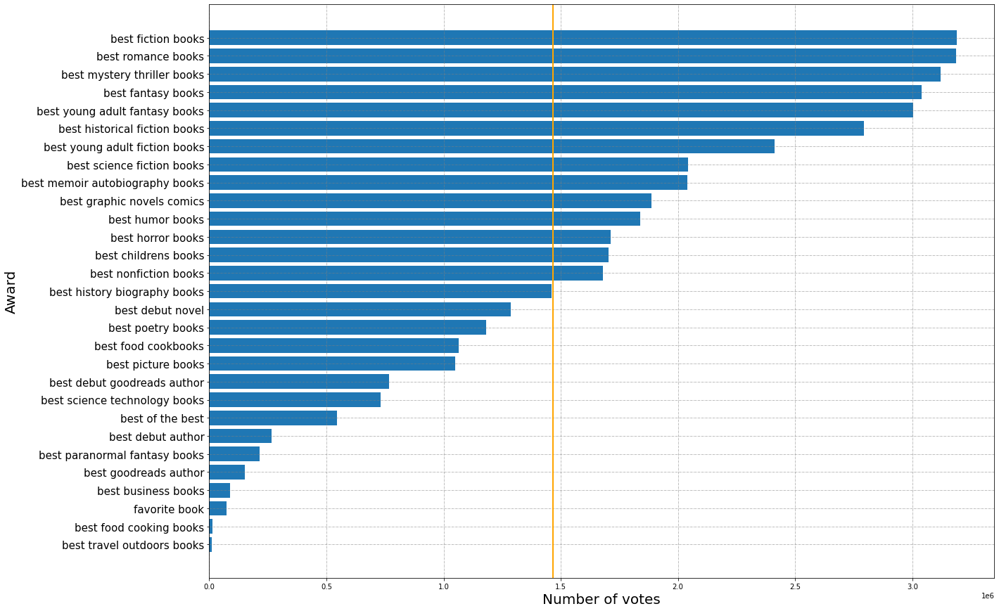

In [221]:
fig, ax = plt.subplots(figsize=(20,15))
ax.barh(df1.index, df1['number_of_votes'])
ax.grid(linestyle='-.', linewidth=0.5, color='gray')
ax.axvline(df1['number_of_votes'].mean(), color='orange', linewidth=2)
ax.set_ylabel('Award', fontsize=20)
ax.set_xlabel('Number of votes', fontsize=20)
ax.set_yticklabels(df1.index, fontsize=15);

### <font color='brown'>WordCloud of awarded book in each category with more votes

In [99]:
df2 = df_join[['award','book_title','number_of_votes']]

In [100]:
awards_list = df_join['award'].unique()

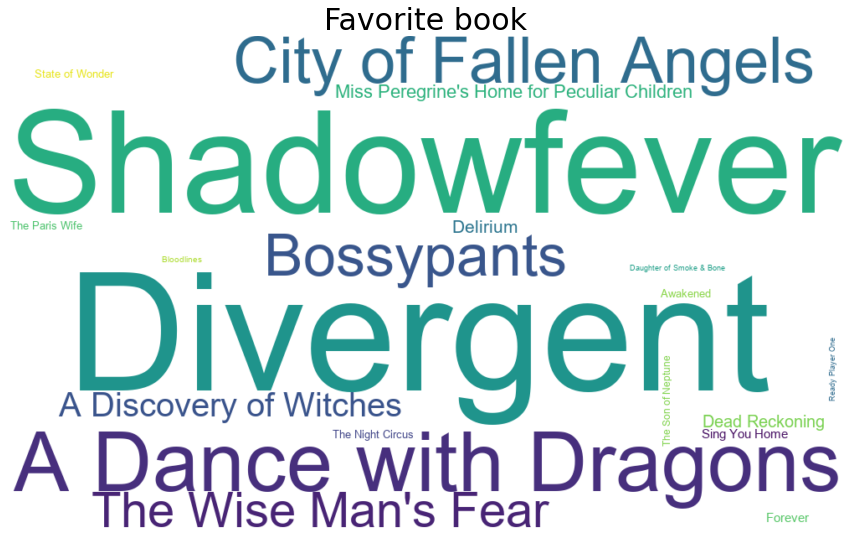

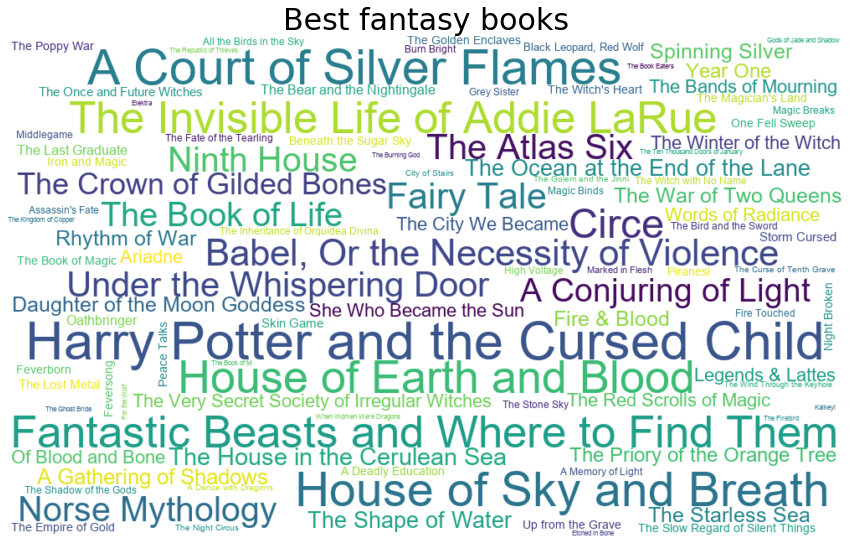

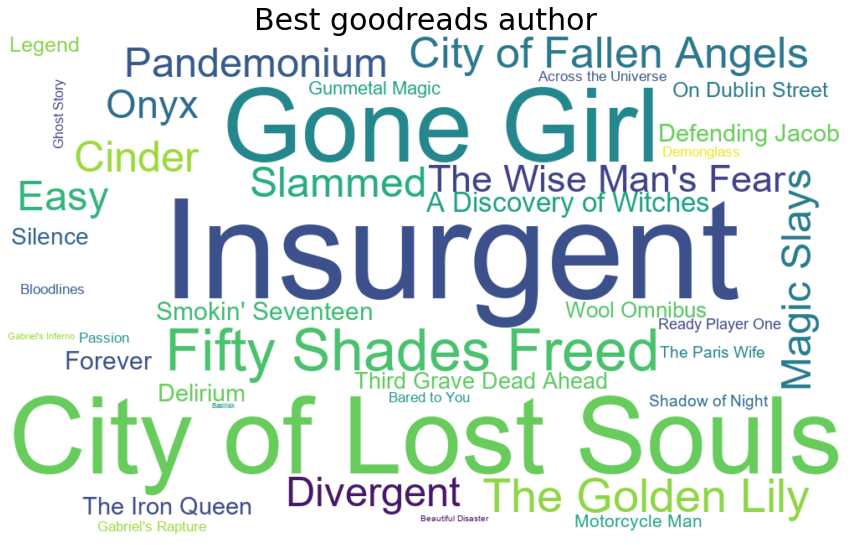

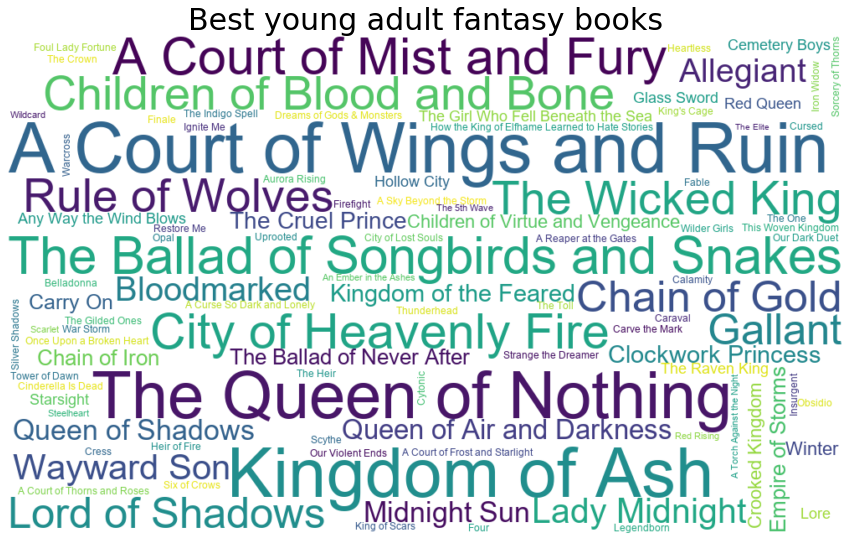

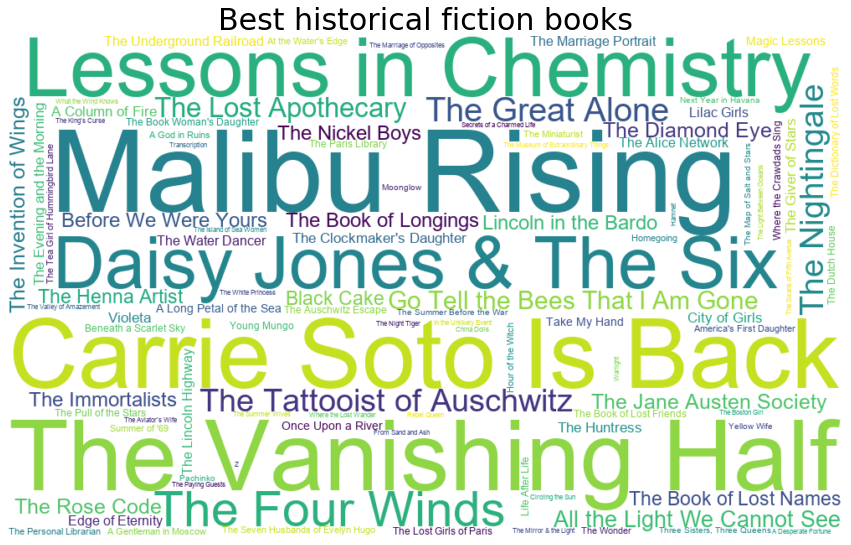

...

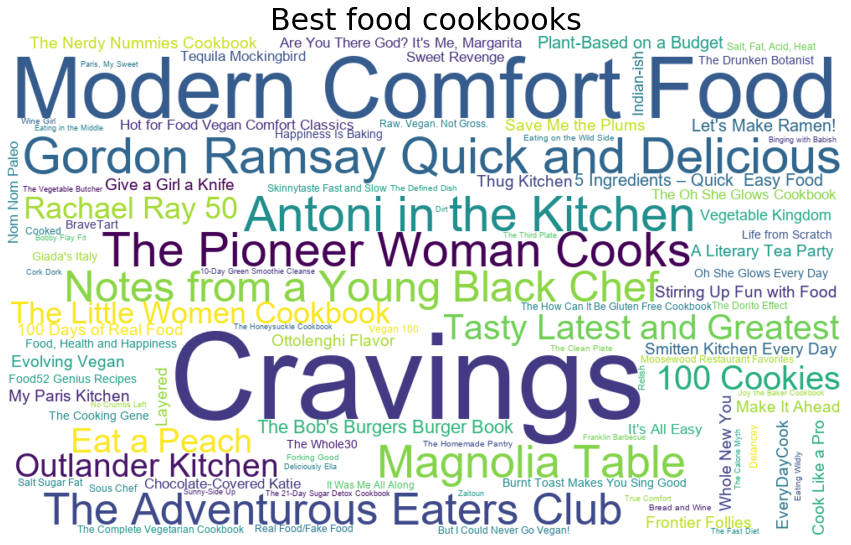

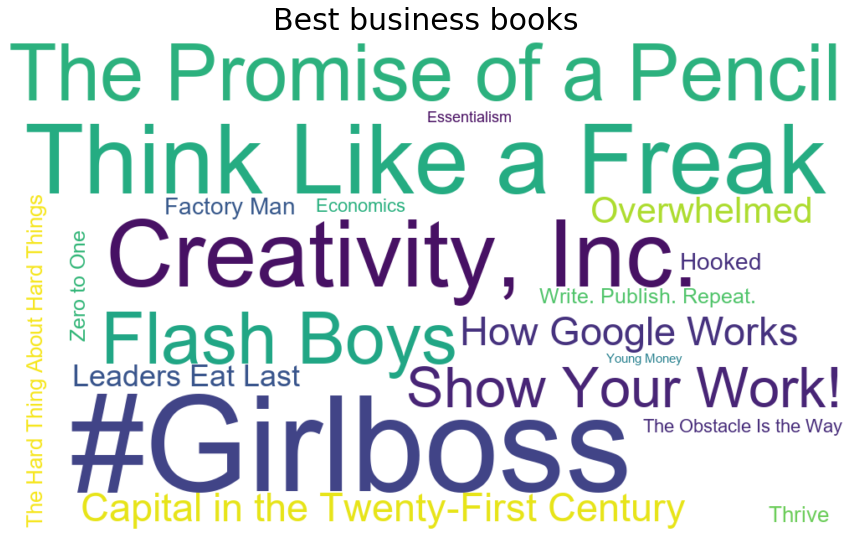

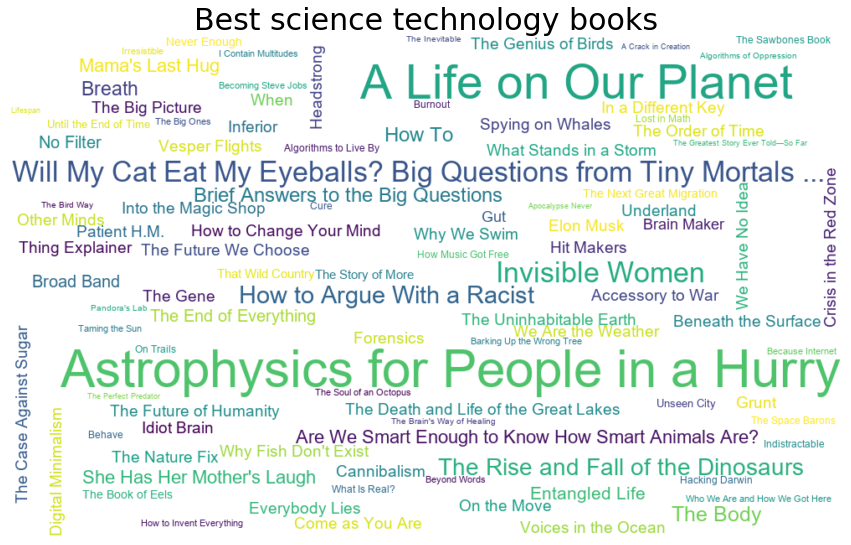

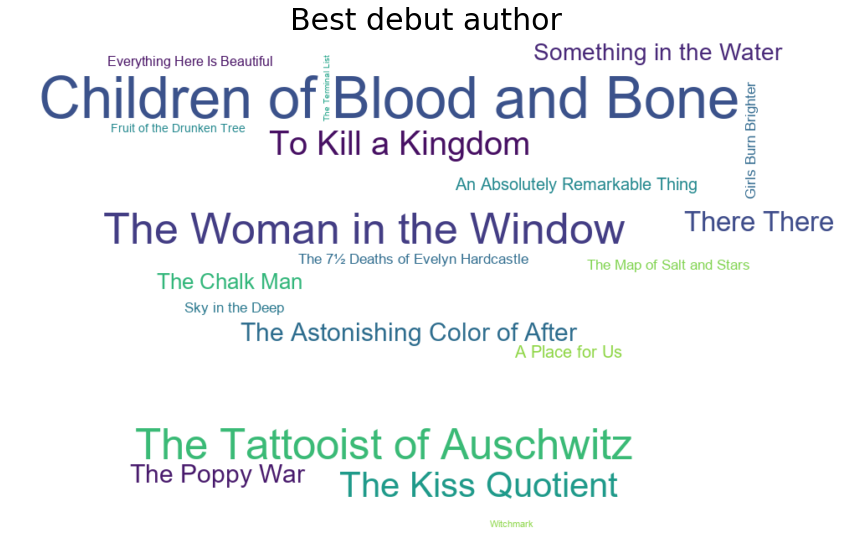

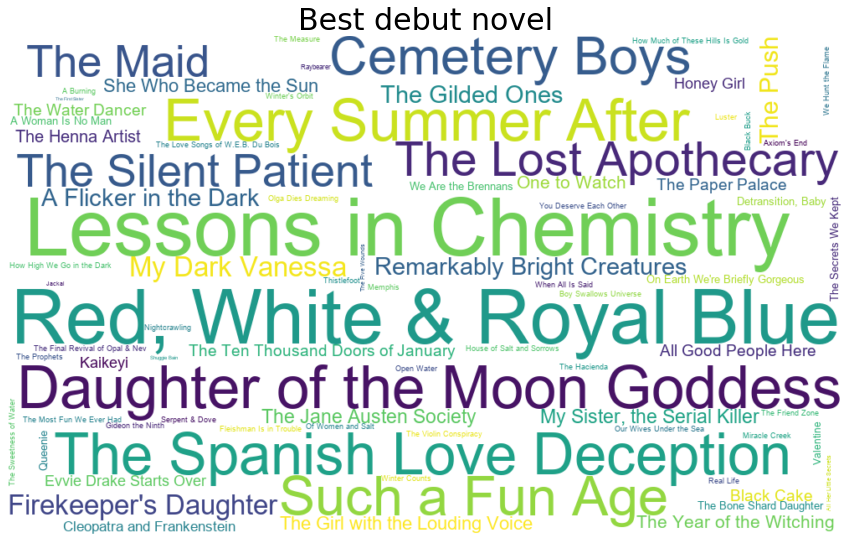

In [101]:
for award in awards_list:
    books_vote = df2[df2['award'] == award].set_index('book_title')[['number_of_votes']].to_dict()['number_of_votes']
    wordcloud = WordCloud(width=1000, height=600, font_path='arial', background_color='white', max_words=100).generate_from_frequencies(books_vote)
    fig = plt.figure(figsize=(15,10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(label=award.capitalize(), fontsize=30)
    plt.axis('off')
    plt.show()

### <font color='brown'>Wordcloud of books has higher ratings overall

In [103]:
df3 = df_books_detail[['title','rating']].sort_values('rating', ascending=False)

In [104]:
df3_dict = df3.set_index('title').to_dict()

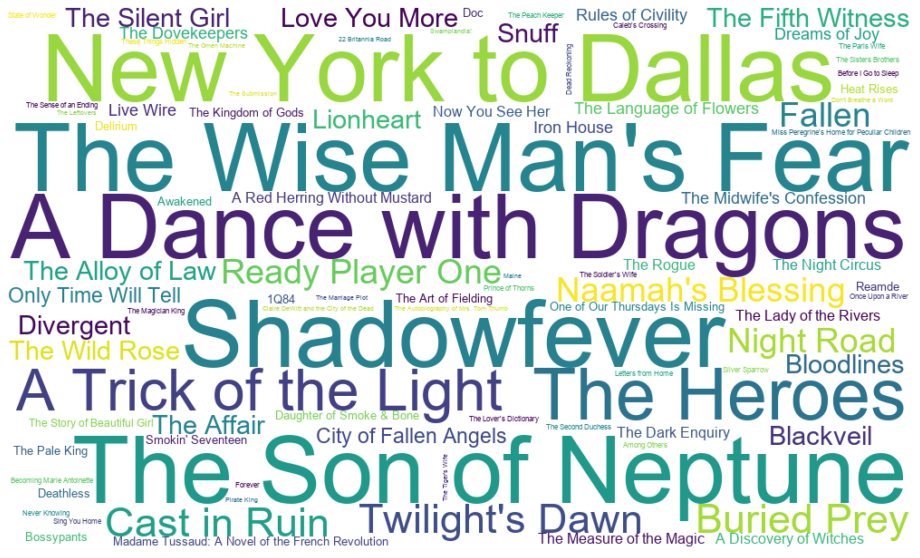

In [105]:
wordcloud = WordCloud(width=1000, height=600, font_path='arial',background_color='white').generate_from_frequencies(df3_dict['rating'])

plt.figure(figsize=(20,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### <font color='brown'>Wordcloud of books won the 'Best fiction' award in 2022 that has ratings above 3.5

In [130]:
df4 = df_join[(df_join['award'] == 'best fiction books') & (df_join['rating'] > 3.5)][['book_title', 'number_of_votes']]

In [131]:
df4_dict = df4.set_index('book_title').to_dict()

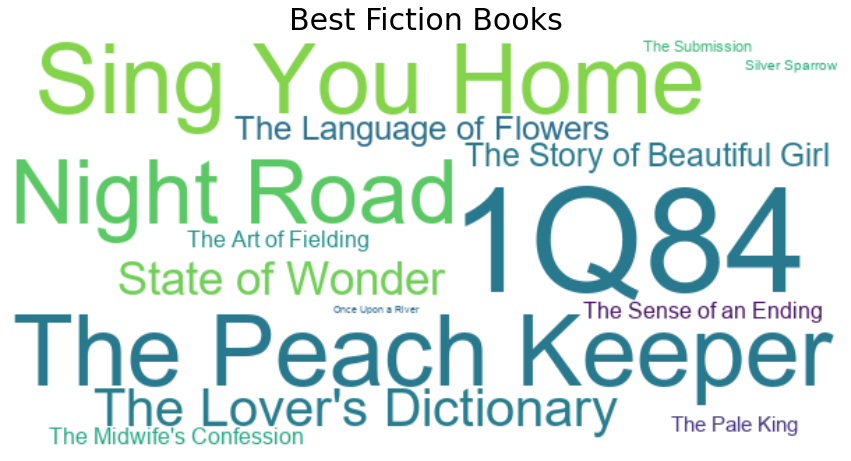

In [132]:

wordcloud = WordCloud(width=600, height=300, 
                      background_color='white', 
                      font_path='arial',
                      margin = 5,
                      collocations=False, 
                      contour_width=3, 
                      contour_color='black', prefer_horizontal=1.1).generate_from_frequencies(df4_dict['number_of_votes'])

plt.figure(figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title(label='Best Fiction Books', fontsize=30)
plt.axis("off")
plt.show()

### <font color='brown'>Are books getting more votes also have higher ratings?

In [222]:
df4= df_join[['rating', 'number_of_votes', 'number_of_reviews']]

Text(0, 0.5, 'Number of votes')

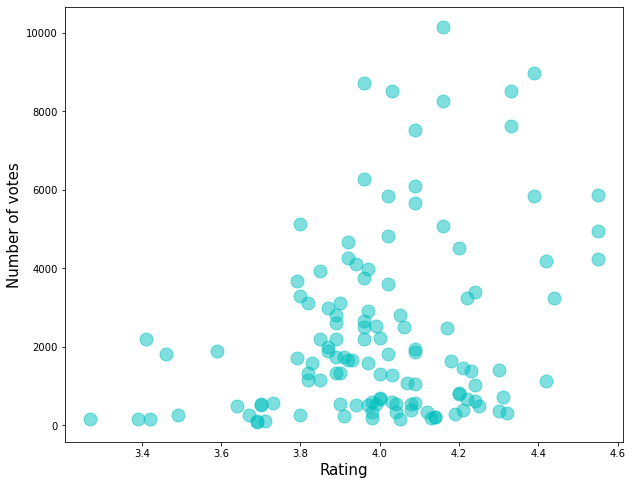

In [223]:
plt.figure(figsize=(10,8))
plt.scatter(df4['rating'], df4['number_of_votes'], s=13**2, c='c', alpha=0.5)
plt.xlabel('Rating', fontsize=15)
plt.ylabel('Number of votes', fontsize=15)

### <font color='bronw'>What's the average rating of books in each award? 

In [242]:
df5 = df_join[['award', 'rating']].groupby('award').mean().sort_values('rating', ascending=True)

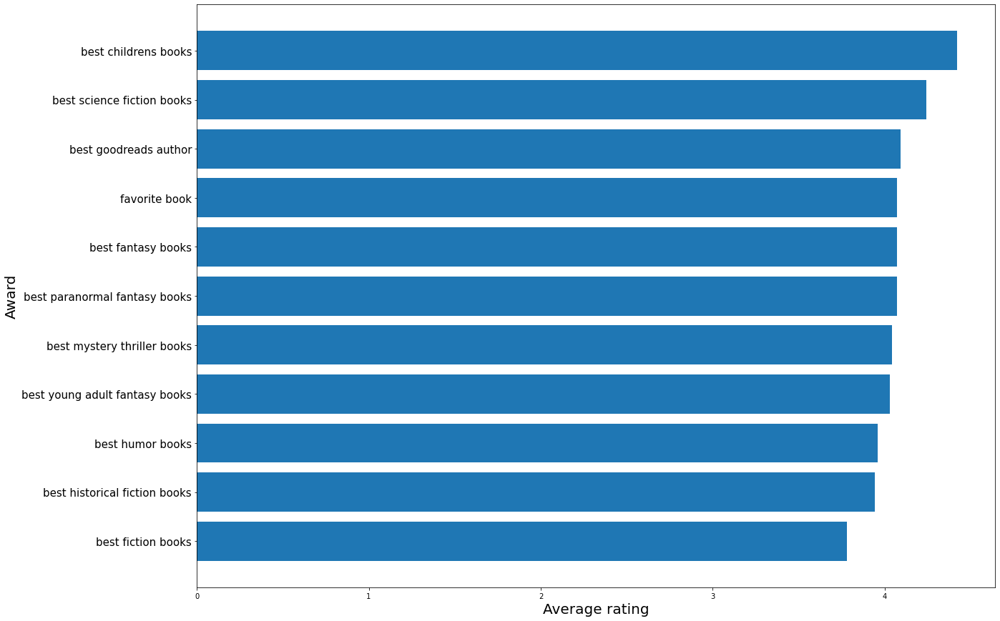

In [244]:
fig, ax = plt.subplots(figsize=(20,15))
ax.barh(df5.index, df5['rating'])
ax.set_ylabel('Award', fontsize=20)
ax.set_xlabel('Average rating', fontsize=20)
ax.set_yticklabels(df5.index, fontsize=15);